To run ipynb in venv:
pip install ipykernel
python -m ipykernel install --user --name odslib --display-name "Python (odslib)"

choose environment in vscode - Python (odslib)

## Imports

In [2]:
import os
import json
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import ListedColormap
from PIL import Image
from pathlib import Path
from collections import defaultdict, Counter
import cv2
import warnings
warnings.filterwarnings('ignore')

## Data Directory Path

In [3]:
DATA_ROOT    = Path('../data/cityscapes')       # root of cityscapes
IMAGES_DIR   = DATA_ROOT / 'images'             # training images
MASKS_DIR    = DATA_ROOT / 'gtFine'             # segmentation masks


In [4]:
print('Data root exists :', DATA_ROOT.exists())
print('Images dir exists:', IMAGES_DIR.exists())
print('Masks dir exists: ', MASKS_DIR.exists())

Data root exists : True
Images dir exists: True
Masks dir exists:  True


os.walk
1st iter
root = "cityscapes"
dirs = ["gtFine"]
files = []
2nd iter 
root = "cityscapes/gtFine"
dirs = ["train", "val"]
files = []
3rd iter
root = "cityscapes/gtFine/train"
dirs = ["aachen", "bochum", ...]
files = []
4th iter
root = "cityscapes/gtFine/train/aachen"
dirs = []
files = ["img1.png", "img2.png"]
loops back

## Dataset Folder Structure

In [5]:
# Print top-level folder structure
for root, dirs, files in os.walk(DATA_ROOT):
    depth = root.replace(str(DATA_ROOT), '').count(os.sep)
    indent = '  ' * depth
    print(f'{indent}{os.path.basename(root)}/')
    if depth < 3:
        for f in files[:3]:  # show first 3 files per folder
            print(f'{indent}  {f}')
        if len(files) > 3:
            print(f'{indent}  ... and {len(files)-3} more files')

cityscapes/
  .gitkeep
  gtFine/
    test/
      aachen/
      bochum/
      bremen/
      cologne/
      darmstadt/
      dusseldorf/
      erfurt/
      hamburg/
      hanover/
      jena/
      krefeld/
      monchengladbach/
      strasbourg/
      stuttgart/
      tubingen/
      ulm/
      weimar/
      zurich/
    train/
      aachen/
      bochum/
      bremen/
      cologne/
      darmstadt/
      dusseldorf/
      erfurt/
      hamburg/
      hanover/
      jena/
      krefeld/
      monchengladbach/
      strasbourg/
      stuttgart/
      tubingen/
      ulm/
      weimar/
      zurich/
    val/
      frankfurt/
      lindau/
      munster/
  images/
    test/
      aachen/
      bochum/
      bremen/
      cologne/
      darmstadt/
      dusseldorf/
      erfurt/
      hamburg/
      hanover/
      jena/
      krefeld/
      monchengladbach/
      strasbourg/
      stuttgart/
      tubingen/
      ulm/
      weimar/
      zurich/
    train/
      aachen/
      bochum/
    

## Count Images per split

In [6]:
# Collect all image files
image_files = list(IMAGES_DIR.rglob('*_leftImg8bit.png'))
print(f'Total images found: {len(image_files)}')

# Count by split and by city
# Folder structure: images/split/city/imagename.png
# So f.parent.name = city,  f.parent.parent.name = split
split_counter = Counter()
city_counter_train  = Counter()
city_counter_val    = Counter()

for f in image_files:
    city  = f.parent.name               # e.g. 'aachen'
    split = f.parent.parent.name        # e.g. 'train' or 'val'
    split_counter[split] += 1
    if split == 'train':
        city_counter_train[city] += 1
    elif split == 'val':
        city_counter_val[city] += 1

print('\nImages per split (train & val):')
for split, count in sorted(split_counter.items()):
    print(f'  {split:10s} : {count} images')

print(f'\nTotal cities in train set: {len(city_counter_train)}')
print('Images per city (train):')
for city, count in sorted(city_counter_train.items()):
    print(f'  {city:25s} : {count}')

print(f'\nTotal cities in validation set: {len(city_counter_val)}')
print('Images per city (validation):')
for city, count in sorted(city_counter_val.items()):
    print(f'  {city:25s} : {count}')


Total images found: 3475

Images per split (train & val):
  test       : 297 images
  train      : 2678 images
  val        : 500 images

Total cities in train set: 18
Images per city (train):
  aachen                    : 155
  bochum                    : 88
  bremen                    : 286
  cologne                   : 136
  darmstadt                 : 75
  dusseldorf                : 201
  erfurt                    : 95
  hamburg                   : 220
  hanover                   : 177
  jena                      : 106
  krefeld                   : 93
  monchengladbach           : 82
  strasbourg                : 327
  stuttgart                 : 179
  tubingen                  : 128
  ulm                       : 86
  weimar                    : 131
  zurich                    : 113

Total cities in validation set: 3
Images per city (validation):
  frankfurt                 : 267
  lindau                    : 59
  munster                   : 174


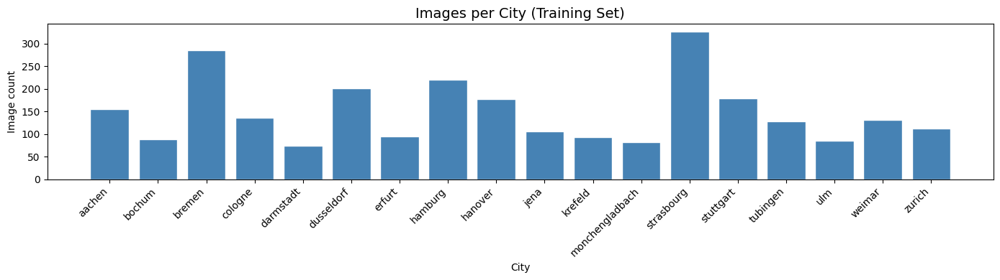

In [7]:
# Bar chart — images per city in training set
if city_counter_train:
    fig, ax = plt.subplots(figsize=(14, 4))
    cities = list(city_counter_train.keys())
    counts = list(city_counter_train.values())
    ax.bar(cities, counts, color='steelblue', edgecolor='white')
    ax.set_title('Images per City (Training Set)', fontsize=14)
    ax.set_xlabel('City')
    ax.set_ylabel('Image count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

rglob() — Recursive search --- searches recursively through all subdirectories --- returns all files even from subfolders

glob() — Non-recursive search --- searches only in the current directory level -- returns all files only in that current folder/path not subfolders

make glob recursive ---> p.glob("**/*.txt")

Use glob() 👉 when files are in one folder
Use rglob() 👉 when files are nested

🧩 glob (from pathlib) - Pattern-based file search -- Returns Path objects -- Filtering Pattern-based (*.png) -- Flexibility medium
🧩 os.walk (from os) - Manual directory traversal -- Returns strings -- Filtering Manual (if file.endswith) -- Flexibility high


mask_path = MASKS_DIR / split / city / f'{base}_gtFine_labelTrainIds.png'
👉 ONLY builds a path object
👉 It does NOT check the filesystem -- returns only dummy path object (like string)

## Annotation Files

For every image, Cityscapes provides 5 annotation files.
Let's look at one image and list all the annotation files that go with it.
This makes the relationship between them concrete before we use any of them.

In [8]:
# Take the first image and find all its annotation files
sample_image = image_files[0]
#print(type(sample_image))
print(f'Sample image: {sample_image.name}')
print(f'Full path   : {sample_image}')

# The base name strips the _leftImg8bit suffix
# e.g. aachen_000000_000019_leftImg8bit  ->  aachen_000000_000019
base = sample_image.stem.replace('_leftImg8bit', '')
print(f'Base name   : {base}')

# Corresponding annotation folder has the same split/city structure
split = sample_image.parent.parent.name   # 'train' or 'val'
city  = sample_image.parent.name          # e.g. 'aachen'

try:
    ann_folder = MASKS_DIR / split / city
    if ann_folder.exists():
        print(f'Annotation folder exists: {ann_folder}')
        print(f'\nAnnotation folder: {ann_folder}')
        ann_files = sorted(ann_folder.glob(f'{base}*'))
        print(f'\nAnnotation files for this sample image:')
        for af in ann_files:
            print(f'  {af.name}')
        print('''
        Understanding each file:
          _gtFine_color.png          -> RGB coloured mask  (visualization only)
          _gtFine_labelIds.png       -> Grayscale, raw label IDs 0-33  (not used directly)
          _gtFine_labelTrainIds.png  -> Grayscale, training IDs 0-18  (USED FOR TRAINING)
          _gtFine_instanceIds.png    -> Each object instance has a unique ID
          _gtFine_instanceTrainIds.png -> Instance IDs using train class IDs
          _gtFine_polygons.json      -> Polygon points per object  (bounding boxes come from this)
        ''')

except Exception as e:
    print(f'Error constructing annotation folder path: {e}')


Sample image: frankfurt_000000_000294_leftImg8bit.png
Full path   : ..\data\cityscapes\images\val\frankfurt\frankfurt_000000_000294_leftImg8bit.png
Base name   : frankfurt_000000_000294
Annotation folder exists: ..\data\cityscapes\gtFine\val\frankfurt

Annotation folder: ..\data\cityscapes\gtFine\val\frankfurt

Annotation files for this sample image:
  frankfurt_000000_000294_gtFine_color.png
  frankfurt_000000_000294_gtFine_instanceIds.png
  frankfurt_000000_000294_gtFine_instanceTrainIds.png
  frankfurt_000000_000294_gtFine_labelIds.png
  frankfurt_000000_000294_gtFine_labelTrainIds.png
  frankfurt_000000_000294_gtFine_polygons.json

        Understanding each file:
          _gtFine_color.png          -> RGB coloured mask  (visualization only)
          _gtFine_labelIds.png       -> Grayscale, raw label IDs 0-33  (not used directly)
          _gtFine_labelTrainIds.png  -> Grayscale, training IDs 0-18  (USED FOR TRAINING)
          _gtFine_instanceIds.png    -> Each object instance h

The 19 Cityscapes Training Classes
Cityscapes has 34 raw classes, but only 19 are used for training.
The rest are mapped to 255 (ignore label — not counted in loss or metrics).

Each class has:

A train_id (0–18) — this is the pixel value in _labelTrainIds.png
A name — what the class is
An RGB colour — used to convert the grayscale mask to a colourful image
The colour palette is also displayed to see what each class looks like -- not random
These colors are:
predefined by dataset creators
consistent across all Cityscapes annotations
used for visualization only

Number of SEGMENTATION classes: 19
Number of DETECTION classes: 8
Ignore label: 255

 ID  Segmentation Class    RGB  Detection?
------------------------------------------------------------
  0  road                  (128,  64, 128)  
  1  sidewalk              (244,  35, 232)  
  2  building              ( 70,  70,  70)  
  3  wall                  (102, 102, 156)  
  4  fence                 (190, 153, 153)  
  5  pole                  (153, 153, 153)  
  6  traffic light         (250, 170,  30)  
  7  traffic sign          (220, 220,   0)  
  8  vegetation            (107, 142,  35)  
  9  terrain               (152, 251, 152)  
 10  sky                   ( 70, 130, 180)  
 11  person                (220,  20,  60)  ✓ (detection)
 12  rider                 (255,   0,   0)  ✓ (detection)
 13  car                   (  0,   0, 142)  ✓ (detection)
 14  truck                 (  0,   0,  70)  ✓ (detection)
 15  bus                   (  0,  60, 100)  ✓ (detection)
 16  train                

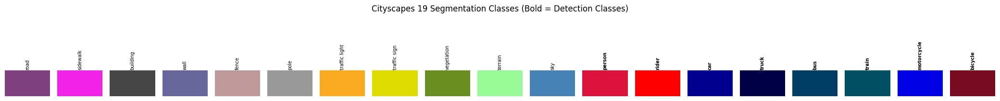

In [9]:
# ============================================================
# SEGMENTATION CLASSES (19 classes for semantic segmentation)
# ============================================================
CITYSCAPES_SEGMENTATION_CLASSES = [
    (0,  'road',           128,  64, 128),
    (1,  'sidewalk',       244,  35, 232),
    (2,  'building',        70,  70,  70),
    (3,  'wall',           102, 102, 156),
    (4,  'fence',          190, 153, 153),
    (5,  'pole',           153, 153, 153),
    (6,  'traffic light',  250, 170,  30),
    (7,  'traffic sign',   220, 220,   0),
    (8,  'vegetation',     107, 142,  35),
    (9,  'terrain',        152, 251, 152),
    (10, 'sky',             70, 130, 180),
    (11, 'person',         220,  20,  60),
    (12, 'rider',          255,   0,   0),
    (13, 'car',              0,   0, 142),
    (14, 'truck',            0,   0,  70),
    (15, 'bus',              0,  60, 100),
    (16, 'train',            0,  80, 100),
    (17, 'motorcycle',       0,   0, 230),
    (18, 'bicycle',        119,  11,  32),
]

SEGMENTATION_CLASS_NAMES = [c[1] for c in CITYSCAPES_SEGMENTATION_CLASSES]
NUM_SEGMENTATION_CLASSES = 19
IGNORE_LABEL = 255

# ============================================================
# DETECTION CLASSES (8 classes for object detection)
# ============================================================
# These are the "thing" classes - objects we want to detect with bounding boxes
DETECTION_CLASSES = [
    'person', 'rider', 'car', 'truck', 'bus', 'train', 
    'motorcycle', 'bicycle'
]

DETECTION_CLASS_NAMES = DETECTION_CLASSES
NUM_DETECTION_CLASSES = 8

print(f'Number of SEGMENTATION classes: {NUM_SEGMENTATION_CLASSES}')
print(f'Number of DETECTION classes: {NUM_DETECTION_CLASSES}')
print(f'Ignore label: {IGNORE_LABEL}')
print()
print(f'{"ID":>3}  {"Segmentation Class":20s}  {"RGB"}  {"Detection?"}')
print('-' * 60)
for tid, name, r, g, b in CITYSCAPES_SEGMENTATION_CLASSES:
    is_det = "✓ (detection)" if name in DETECTION_CLASSES else ""
    print(f'{tid:>3}  {name:20s}  ({r:3d}, {g:3d}, {b:3d})  {is_det}')

# ── Show the colour palette ──
fig, axes = plt.subplots(1, NUM_SEGMENTATION_CLASSES, figsize=(NUM_SEGMENTATION_CLASSES * 1.1, 1.8))
for i, (tid, name, r, g, b) in enumerate(CITYSCAPES_SEGMENTATION_CLASSES):
    axes[i].add_patch(patches.Rectangle((0, 0), 1, 1, color=(r/255, g/255, b/255)))
    axes[i].set_xlim(0, 1)
    axes[i].set_ylim(0, 1)
    axes[i].axis('off')
    # Mark detection classes with bold
    fontweight = 'bold' if name in DETECTION_CLASSES else 'normal'
    axes[i].set_title(name, fontsize=7, rotation=90, pad=3, fontweight=fontweight)
plt.suptitle('Cityscapes 19 Segmentation Classes (Bold = Detection Classes)', fontsize=12, y=1.15)
plt.tight_layout()
plt.show()

### Sample up to 100 images and check their resolutions

In [10]:

sample_files = random.sample(image_files, min(100, len(image_files)))
resolutions  = []

for f in sample_files:
    img = Image.open(f)
    resolutions.append(img.size)  # (width, height)

widths  = [r[0] for r in resolutions]
heights = [r[1] for r in resolutions]

print(f'Width  — min: {min(widths)}, max: {max(widths)}, mean: {np.mean(widths):.0f}')
print(f'Height — min: {min(heights)}, max: {max(heights)}, mean: {np.mean(heights):.0f}')


Width  — min: 2048, max: 2048, mean: 2048
Height — min: 1024, max: 1024, mean: 1024


### Visualizing 8 random raw images

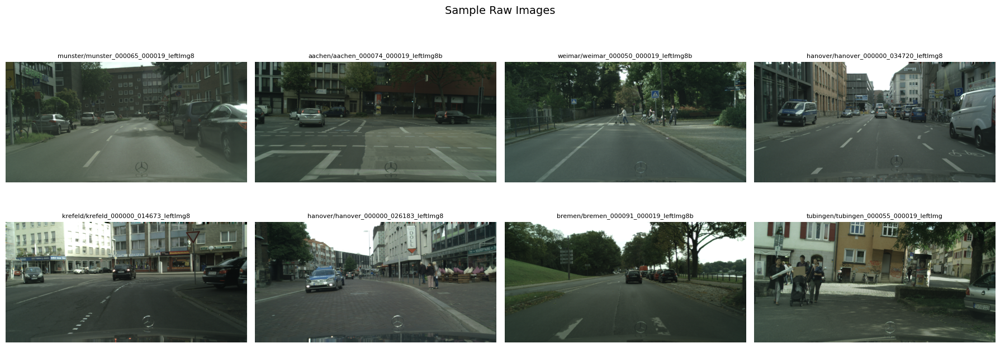

In [11]:
#raw images - any 8
sample = random.sample(image_files, min(8, len(image_files)))

fig, axes = plt.subplots(2, 4, figsize=(18, 7))
axes = axes.flatten()

for i, f in enumerate(sample):
    img = Image.open(f).convert('RGB')
    axes[i].imshow(img)
    axes[i].set_title(f.parent.name + '/' + f.name[:30], fontsize=8)
    axes[i].axis('off')

plt.suptitle('Sample Raw Images', fontsize=14)
plt.tight_layout()
plt.show()

### Visualizing 2 samples from Dataset with annotation images corresponding to the sample

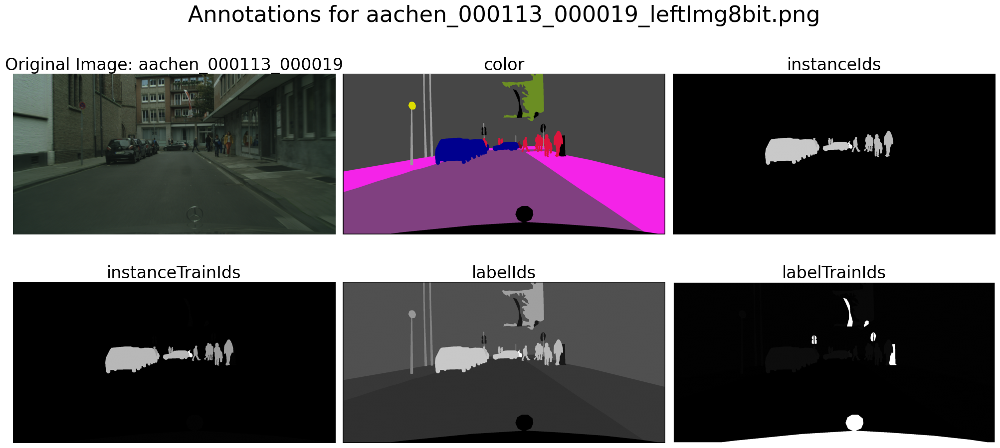

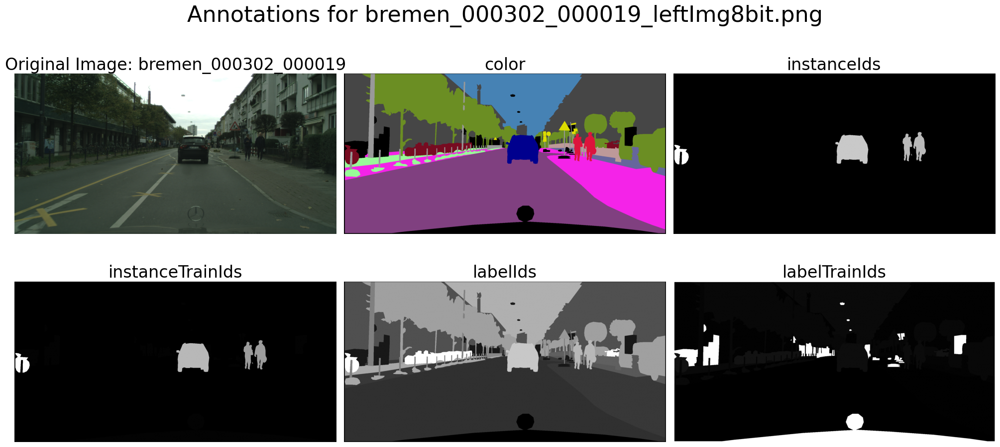

In [12]:
#sample annotation masked images - any 2
# each has 5 annotation types (color, labelIds, labelTrainIds, instanceIds, instanceTrainIds)

sample = random.sample(image_files, min(2, len(image_files)))
for img_file in sample:
    img_name = img_file.name
    base = img_file.stem.replace('_leftImg8bit', '')
    split = img_file.parent.parent.name
    city  = img_file.parent.name
    ann_folder = MASKS_DIR / split / city
    ann_files = sorted(ann_folder.glob(f'{base}*.png'))
    fig, axes = plt.subplots(2, 3, figsize=(20, 10))
    axes = axes.flatten()
    axes[0].imshow(Image.open(img_file))
    axes[0].set_title(f'Original Image: {base}', fontsize=24)
    axes[0].axis('off')
    for i, ann_file in enumerate(ann_files):
        ann_img = Image.open(ann_file)
        axes[i+1].imshow(ann_img, cmap='gray' if 'colour' not in ann_file.name else None)
        axes[i+1].set_title(ann_file.name.split('_')[-1].replace('.png', ''), fontsize=24)
        axes[i+1].axis('off')
    plt.suptitle(f'Annotations for {img_name}', fontsize=32)
    plt.tight_layout()  
    plt.show()


## Understand labelTrainIds: Why Is It Black?

_gtFine_labelTrainIds.png is a grayscale image where each pixel value = class ID.

Road pixel → value 0
Sidewalk pixel → value 1
Building pixel → value 2
... and so on up to 18
Ignore region → value 255

When you display this as a normal image, values 0–18 are almost black (since 18 out of 255 brightness is very dark). That is why it looks like binary — but it is actually grayscale

In [13]:
def find_label_mask(image_path):
    """
    Given an image path like: images/train/aachen/aachen_000000_000019_leftImg8bit.png
    Returns the path to:       gtFine/train/aachen/aachen_000000_000019_gtFine_labelTrainIds.png

    """
    base  = image_path.stem.replace('_leftImg8bit', '')   # aachen_000000_000019
    split = image_path.parent.parent.name                  # train or val
    city  = image_path.parent.name                         # aachen
    mask_path = MASKS_DIR / split / city / f'{base}_gtFine_labelTrainIds.png'
    colour_mask_path = MASKS_DIR / split / city / f'{base}_gtFine_color.png'
    return mask_path, colour_mask_path if mask_path.exists() and colour_mask_path.exists() else (None, None)

def label_to_color(label_mask_array):
    """
    Converts a label ID mask (H, W) to a colour image (H, W, 3).
    Input:  2D numpy array where each value is a class ID (0–18) or 255 (ignore)
    Output: 3D numpy array (H, W, 3) with RGB colours from CITYSCAPES_CLASSES
    """
    h, w  = label_mask_array.shape
    color = np.zeros((h, w, 3), dtype=np.uint8)   # start with black
    for tid, name, r, g, b in CITYSCAPES_CLASSES:
        color[label_mask_array == tid] = [r, g, b]
    return color

# ── Test with one image ──
test_image = image_files[0]
test_mask_path, test_colour_mask_path = find_label_mask(test_image)

print(f'Image     : {test_image.name}')
print(f'Mask path : {test_mask_path}')
print(f'Colour mask path : {test_colour_mask_path}')
print(f'Mask exists: {test_mask_path is not None}')

Image     : frankfurt_000000_000294_leftImg8bit.png
Mask path : ..\data\cityscapes\gtFine\val\frankfurt\frankfurt_000000_000294_gtFine_labelTrainIds.png
Colour mask path : ..\data\cityscapes\gtFine\val\frankfurt\frankfurt_000000_000294_gtFine_color.png
Mask exists: True


In [14]:
# ── Load and inspect the label mask ──
if test_mask_path:
    # PIL opens the PNG as a grayscale-like image
    # We convert to numpy array to see the actual pixel values
    label_mask = np.array(Image.open(test_mask_path))

    print(f'Mask array shape : {label_mask.shape}')       # should be (H, W)
    print(f'Mask dtype       : {label_mask.dtype}')       # uint8
    print(f'Min pixel value  : {label_mask.min()}')       # should be 0
    print(f'Max pixel value  : {label_mask.max()}')       # should be <= 255
    print(f'Unique values    : {sorted(np.unique(label_mask).tolist())}')
    print()
    print('What those values mean:')
    unique_ids = np.unique(label_mask)
    for uid in unique_ids:
        if uid == 255:
            print(f'  {uid:3d}  -> IGNORE (sky border, unlabeled regions)')
        elif uid < len(CITYSCAPES_CLASSES):
            name = CITYSCAPES_CLASSES[uid][1]
            print(f'  {uid:3d}  -> {name}')
        else:
            print(f'  {uid:3d}  -> unknown')

Mask array shape : (1024, 2048)
Mask dtype       : uint8
Min pixel value  : 0
Max pixel value  : 255
Unique values    : [0, 1, 2, 4, 5, 7, 8, 10, 11, 13, 255]

What those values mean:
    0  -> road
    1  -> sidewalk
    2  -> building
    4  -> fence
    5  -> pole
    7  -> traffic sign
    8  -> vegetation
   10  -> sky
   11  -> person
   13  -> car
  255  -> IGNORE (sky border, unlabeled regions)


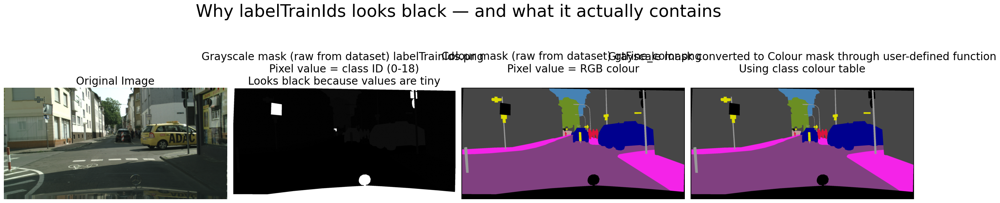

In [15]:
# ── Show: original image | raw label mask | colour mask from dataset | converted colourised mask ──
if test_mask_path:
    original  = np.array(Image.open(test_image).convert('RGB'))
    label_raw = np.array(Image.open(test_mask_path))          # grayscale (looks black)
    label_col = label_to_color(label_raw)                     # colourised version
    colour_raw = np.array(Image.open(test_colour_mask_path))  # colour mask from dataset
    
    fig, axes = plt.subplots(1, 4, figsize=(24, 7))

    axes[0].imshow(original)
    axes[0].set_title('Original Image', fontsize=20)
    axes[0].axis('off')

    axes[1].imshow(label_raw, cmap='gray')
    axes[1].set_title('Grayscale mask (raw from dataset) labelTrainIds.png \n'
                       'Pixel value = class ID (0-18)\n'
                       'Looks black because values are tiny', fontsize=20)
    axes[1].axis('off')

    axes[2].imshow(colour_raw)
    axes[2].set_title('Colour mask (raw from dataset) gtFine_color.png \n'
                       'Pixel value = RGB colour\n', fontsize=20)
    axes[2].axis('off')

    axes[3].imshow(label_col)
    axes[3].set_title('Grayscale mask converted to Colour mask through user-defined function\n'
                       'Using class colour table\n', fontsize=20)
    axes[3].axis('off')

    plt.suptitle('Why labelTrainIds looks black — and what it actually contains', fontsize=32)
    plt.tight_layout()
    plt.show()

### Note that the colour raw is already part of dataset *_gtFine_colour.png

## Overlay grayscale mask and colour mask on raw image to visualize and verify mask 

An overlay blends the original image with the coloured mask.
Formula: overlay = 0.6 * image + 0.4 * mask
colour_overlay = 0.6 * image + 0.4 * colour_mask
This makes it easy to see whether the mask aligns correctly with the objects in the image.

We do this for 6 random images to confirm the annotations look correct.

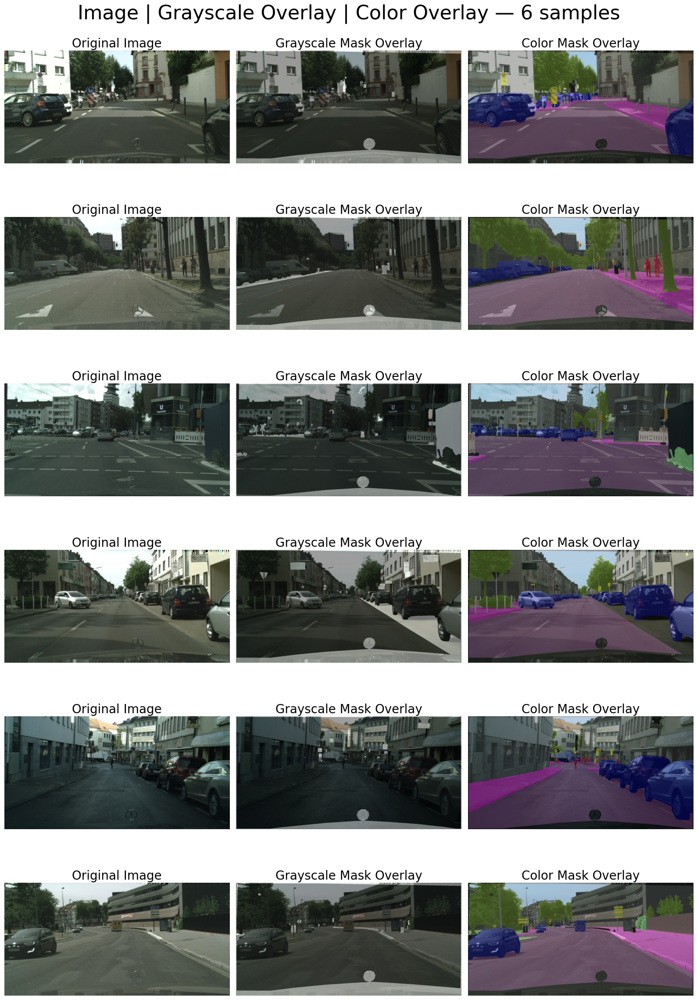

In [16]:
random_img_files = random.sample(image_files, min(6, len(image_files)))
pairs = []
for f in random_img_files:
    mask_path, colour_mask_path = find_label_mask(f)
    if mask_path is not None:
        pairs.append((f, mask_path))


# Display: image | grayscale overlay | color overlay
fig, axes = plt.subplots(len(pairs), 3, figsize=(16, 4 * len(pairs)))

for row, (img_path, mask_path) in enumerate(pairs):
    img  = np.array(Image.open(img_path).convert('RGB')).astype(np.float32)          # shape (H, W, 3)
    mask = np.array(Image.open(mask_path)).astype(np.float32)          # shape (H, W), dtype uint8

    # --------  GRAYSCALE OVERLAY --------
    # Normalize mask for visibility (0–255 → 0–1)
    mask_norm = mask / mask.max() if mask.max() > 0 else mask

    # Convert to 3-channel grayscale
    mask_gray_3ch = np.stack([mask_norm]*3, axis=-1)

    gray_overlay = (0.6 * img/255.0 + 0.4 * mask_gray_3ch) * 255
    gray_overlay = gray_overlay.astype(np.uint8)

    # -------- 2. COLOR MASK + OVERLAY --------
    mask_col = label_to_color(mask.astype(np.uint8))   # (H, W, 3)

    color_overlay = (0.6 * img + 0.4 * mask_col.astype(np.float32)).astype(np.uint8)

    # -------- PLOTTING --------
    # Original
    axes[row][0].imshow(img.astype(np.uint8))
    axes[row][0].set_title('Original Image', fontsize=20)
    axes[row][0].axis('off')

    # Grayscale overlay
    axes[row][1].imshow(gray_overlay)
    axes[row][1].set_title('Grayscale Mask Overlay', fontsize=20)
    axes[row][1].axis('off')

    # Color overlay
    axes[row][2].imshow(color_overlay)
    axes[row][2].set_title('Color Mask Overlay', fontsize=20)
    axes[row][2].axis('off')

plt.suptitle('Image | Grayscale Overlay | Color Overlay — 6 samples', fontsize=32)
plt.tight_layout()
plt.show()

## SEGMENTATION: Pixel-level Class Distribution
### Pixel-level Class Imbalance: Pixel Count Per Class


In segmentation, the model predicts a class for every pixel

In driving scenes, road and sky cover most of the pixels.
Classes like bicycle, motorcycle, and rider cover very few pixels.

If we train without handling this, the model will learn to predict road and sky well,
but completely ignore bicycles — because ignoring them gives a good average loss.

This tells us whether we need either Dice Loss or Weighted Cross-Entropy to fix this.

sample 100 masks, count how many pixels belong to each class, and plot it.

In [11]:
# ============================================================
# SEGMENTATION: Pixel-level Class Distribution
# ============================================================
# This analyzes SEGMENTATION masks (19 classes)
# NOT detection bounding boxes

all_mask_files = list(MASKS_DIR.rglob('*_gtFine_labelTrainIds.png'))
print(f'Total label mask files: {len(all_mask_files)}')

sample_masks = random.sample(all_mask_files, min(100, len(all_mask_files)))

# Count pixels per SEGMENTATION class
pixel_counts = Counter()

for mask_path in sample_masks:
    mask = np.array(Image.open(mask_path))
    for tid in range(NUM_SEGMENTATION_CLASSES):
        pixel_counts[tid] += int((mask == tid).sum())

print(f'Pixel counts for every SEGMENTATION class in {len(sample_masks)} sampled masks:\n{pixel_counts}')
total_pixels = sum(pixel_counts.values())

print(f'\n📊 SEGMENTATION Pixel Distribution (sampled from {len(sample_masks)} masks):')
print(f'{"ID":>3}  {"Class":20s}  {"Pixels":>12}  {"Percent":>8}  {"Detection?"}')
print('-' * 65)

for tid, name, *_ in sorted(CITYSCAPES_SEGMENTATION_CLASSES, key=lambda x: -pixel_counts[x[0]]):
    pct = 100 * pixel_counts[tid] / total_pixels if total_pixels else 0
    bar = '█' * int(pct / 2)
    is_det = "✓" if name in DETECTION_CLASSES else ""
    print(f'{tid:>3}  {name:20s}  {pixel_counts[tid]:>12,}  {pct:>7.2f}%  {bar}  {is_det}')

print('\n⚠️  NOTE: This is PIXEL-level distribution for SEGMENTATION.')
print('    Detection object counts will be analyzed separately using polygon JSON.')

Total label mask files: 3475
Pixel counts for every SEGMENTATION class in 100 sampled masks:
Counter({0: 70781807, 2: 40457891, 8: 30982585, 13: 13724284, 1: 11164904, 10: 7298133, 5: 2341129, 11: 2174743, 4: 1570470, 9: 1523624, 7: 864470, 3: 844397, 18: 797910, 16: 771681, 14: 418516, 6: 345107, 17: 186300, 15: 179722, 12: 155118})

📊 SEGMENTATION Pixel Distribution (sampled from 100 masks):
 ID  Class                       Pixels   Percent  Detection?
-----------------------------------------------------------------
  0  road                    70,781,807    37.94%  ██████████████████  
  2  building                40,457,891    21.68%  ██████████  
  8  vegetation              30,982,585    16.61%  ████████  
 13  car                     13,724,284     7.36%  ███  ✓
  1  sidewalk                11,164,904     5.98%  ██  
 10  sky                      7,298,133     3.91%  █  
  5  pole                     2,341,129     1.25%    
 11  person                   2,174,743     1.17%    ✓

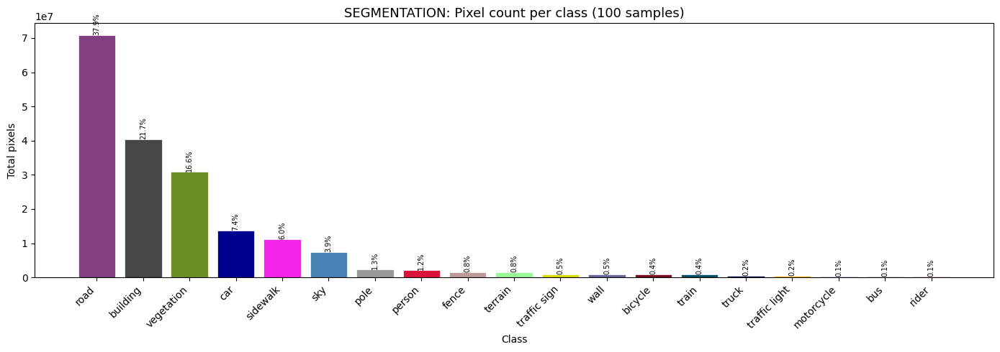


🔑 Key finding for SEGMENTATION:
   road, vegetation, sky, building dominate pixel-wise.
   This is EXPECTED in segmentation — stuff classes cover most pixels.


In [12]:
# Bar chart — SEGMENTATION pixel distribution
sorted_classes = sorted(CITYSCAPES_SEGMENTATION_CLASSES, key=lambda x: -pixel_counts[x[0]])
names  = [c[1] for c in sorted_classes]
counts = [pixel_counts[c[0]] for c in sorted_classes]
colors = [(c[2]/255, c[3]/255, c[4]/255) for c in sorted_classes]

fig, ax = plt.subplots(figsize=(14, 5))
bars = ax.bar(names, counts, color=colors, edgecolor='white', linewidth=0.5)

for bar, count in zip(bars, counts):
    pct = 100 * count / total_pixels if total_pixels else 0
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height(),
        f'{pct:.1f}%',
        ha='center', va='bottom', fontsize=7, rotation=90
    )

ax.set_title('SEGMENTATION: Pixel count per class (100 samples)', fontsize=13)
ax.set_xlabel('Class')
ax.set_ylabel('Total pixels')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

print('\n🔑 Key finding for SEGMENTATION:')
print('   road, vegetation, sky, building dominate pixel-wise.')
print('   This is EXPECTED in segmentation — stuff classes cover most pixels.')

## Understanding the Polygon JSON
The polygon JSON file contains exact boundary points for every object in the image.
We use this to get bounding boxes for detection.


#### How bounding boxes are derived from polygons:

A polygon is a list of (x, y) points tracing an object's outline.
The bounding box is simply:
x_min = leftmost x point
x_max = rightmost x point
y_min = topmost y point
y_max = bottommost y point

In [14]:
# Find all polygon JSON files
json_files = list(MASKS_DIR.rglob('*_gtFine_polygons.json'))
print(f'Total polygon JSON files: {len(json_files)}')

# Load one example and inspect its structure
with open(json_files[0]) as f:
    data = json.load(f)


print(f'\nJSON file: {json_files[0].name}')
print(f'\nKeys in JSON: {list(data.keys())}')
print(f'Image size from JSON: {data["imgWidth"]} x {data["imgHeight"]}')
print(f"Number of objects in this JSON / Total objects annotated: {len(data['objects'])}")
print()

polygon_points = defaultdict(list)
#obj_counter = Counter()
for obj in data['objects']:
    #obj_counter[obj["label"]] += 1
    #poly = obj['polygon']                              # list of [x, y] points
    polygon_points[obj["label"]].append(obj['polygon'])
    #print(f'{obj["label"]:20s}  {len(poly):>15} points')

print()
print('Objects in this JSON:')
print(f'{"Label":20s}  {"Occurrence":<5}  {"Polygon points":>15}')
print('-' * 40)
for key,value in polygon_points.items():
    print(f"{key:20s}  {len(value):<2} times   {[len(v) for v in value]} points")
print()

print(f'Number of objects per class in this JSON: ')
for key,value in polygon_points.items():
    print(f"{key}: {len(value)}")

print()
print('Example: first object polygon:')
print(data['objects'][0]['polygon'])



Total polygon JSON files: 3475

JSON file: frankfurt_000000_000294_gtFine_polygons.json

Keys in JSON: ['imgHeight', 'imgWidth', 'objects']
Image size from JSON: 2048 x 1024
Number of objects in this JSON / Total objects annotated: 57


Objects in this JSON:
Label                 Occurrence   Polygon points
----------------------------------------
sky                   1  times   [6] points
road                  1  times   [6] points
sidewalk              3  times   [12, 9, 24] points
vegetation            2  times   [7, 66] points
pole                  13 times   [9, 6, 5, 4, 5, 8, 15, 17, 4, 25, 7, 6, 6] points
building              5  times   [8, 9, 35, 60, 10] points
traffic sign          12 times   [6, 7, 12, 5, 9, 5, 5, 10, 6, 33, 6, 4] points
fence                 1  times   [13] points
static                6  times   [10, 6, 5, 11, 13, 13] points
person                4  times   [25, 32, 29, 30] points
car                   3  times   [14, 38, 59] points
ego vehicle           

In [15]:
print(f'Full json content of {json_files[0].name}:\n {json.dumps(data, indent=2)[:]}') 

Full json content of frankfurt_000000_000294_gtFine_polygons.json:
 {
  "imgHeight": 1024,
  "imgWidth": 2048,
  "objects": [
    {
      "label": "sky",
      "polygon": [
        [
          704,
          191
        ],
        [
          1044,
          404
        ],
        [
          1293,
          128
        ],
        [
          1320,
          0
        ],
        [
          678,
          0
        ],
        [
          701,
          190
        ]
      ]
    },
    {
      "label": "road",
      "polygon": [
        [
          1145,
          391
        ],
        [
          13,
          467
        ],
        [
          0,
          466
        ],
        [
          0,
          1024
        ],
        [
          2048,
          1024
        ],
        [
          2048,
          446
        ]
      ]
    },
    {
      "label": "sidewalk",
      "polygon": [
        [
          1768,
          570
        ],
        [
          1726,
          573
        ]

### Object level Class Imbalance : Objects per Class, #Objects per Image 

In object detection, the model predicts:

bounding boxes & class labels per object, so object level imbalance must be analysed


### ALL classes present in polygon JSON files #40

In [16]:
# ============================================================
# Find ALL classes present in polygon JSON files
# (includes stuff classes like 'out of roi', 'ego vehicle', etc.)
# ============================================================
all_json_classes = set()
for json_file in json_files:
    with open(json_file) as f:
        data = json.load(f)
        for obj in data['objects']:
            all_json_classes.add(obj['label'])

print(f"Total unique classes found in JSON files: {len(all_json_classes)}")
print("\nAll classes in the polygon JSON files:")
for i, name in enumerate(sorted(all_json_classes)):
    print(name, end=', ')
    if (i + 1) % 10 == 0:
        print()

print(f"\n\n🎯 Our DETECTION classes (8): {DETECTION_CLASSES}")
print(f"📊 SEGMENTATION classes (19): {SEGMENTATION_CLASS_NAMES}")

Total unique classes found in JSON files: 40

All classes in the polygon JSON files:
bicycle, bicyclegroup, bridge, building, bus, car, caravan, cargroup, dynamic, ego vehicle, 
fence, ground, guard rail, license plate, motorcycle, motorcyclegroup, out of roi, parking, person, persongroup, 
pole, polegroup, rail track, rectification border, rider, ridergroup, road, sidewalk, sky, static, 
terrain, traffic light, traffic sign, trailer, train, truck, truckgroup, tunnel, vegetation, wall, 


🎯 Our DETECTION classes (8): ['person', 'rider', 'car', 'truck', 'bus', 'train', 'motorcycle', 'bicycle']
📊 SEGMENTATION classes (19): ['road', 'sidewalk', 'building', 'wall', 'fence', 'pole', 'traffic light', 'traffic sign', 'vegetation', 'terrain', 'sky', 'person', 'rider', 'car', 'truck', 'bus', 'train', 'motorcycle', 'bicycle']


### DETECTION: Object count per class (8 detection classes only)

In [17]:
# ============================================================
# DETECTION: Object count per class (8 detection classes only)
# ============================================================
json_files = list(MASKS_DIR.rglob('*_gtFine_polygons.json'))

# Count objects for DETECTION classes only
detection_obj_counter = Counter()

for json_file in json_files:
    with open(json_file) as f:
        data = json.load(f)
        for obj in data['objects']:
            if obj['label'] in DETECTION_CLASSES:  # Filter detection classes only
                detection_obj_counter[obj['label']] += 1

print("🎯 DETECTION: Object count per class (8 detection classes, ALL splits)")
print(f'{"Class":15s}  {"Count":>8}')
print('-' * 25)
for label, count in sorted(detection_obj_counter.items(), key=lambda x: -x[1]):
    print(f"{label:15s}  {count:>8,}")

print(f"\nTotal detection objects (all splits): {sum(detection_obj_counter.values()):,}")

🎯 DETECTION: Object count per class (8 detection classes, ALL splits)
Class               Count
-------------------------
car                31,822
person             21,413
bicycle             4,904
rider               2,363
motorcycle            888
truck                 582
bus                   483
train                 194

Total detection objects (all splits): 62,649


### DETECTION: Object count per class (8 detection classes only)
### Training Split onLY

In [18]:
# DETECTION: Training split only
MASKS_DIR_TRAIN = MASKS_DIR / 'train'
json_files_train = list(MASKS_DIR_TRAIN.rglob('*_gtFine_polygons.json'))

detection_obj_counter_train = Counter()

for json_file in json_files_train:
    with open(json_file) as f:
        data = json.load(f)
        for obj in data['objects']:
            if obj['label'] in DETECTION_CLASSES:
                detection_obj_counter_train[obj['label']] += 1

print("🎯 DETECTION: Object count per class (Training Split ONLY)")
print(f'{"Class":15s}  {"Count":>8}')
print('-' * 25)
for label, count in sorted(detection_obj_counter_train.items(), key=lambda x: -x[1]):
    print(f"{label:15s}  {count:>8,}")

print(f"\nTotal detection objects in training split: {sum(detection_obj_counter_train.values()):,}")

🎯 DETECTION: Object count per class (Training Split ONLY)
Class               Count
-------------------------
car                24,292
person             16,392
bicycle             3,347
rider               1,626
motorcycle            652
truck                 429
bus                   360
train                 150

Total detection objects in training split: 47,248


### Detection : Objects count per class PLOT -- Training Split

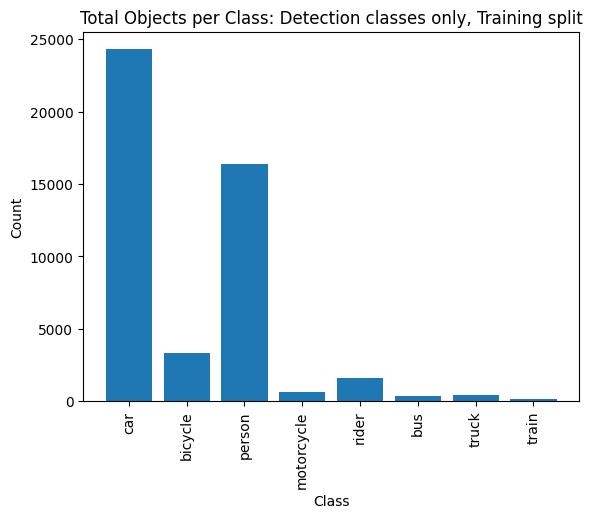

In [20]:

plt.figure()
plt.bar(detection_obj_counter_train.keys(), detection_obj_counter_train.values())
plt.xticks(rotation=90)
plt.title("Total Objects per Class: Detection classes only, Training split")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

### DETECTION: Average objects per image (8 detection classes only) -- Training Split

In [22]:
# ============================================================
# DETECTION: Average objects per image (8 detection classes only)
# ============================================================
MASKS_DIR_TRAIN = MASKS_DIR / 'train'
json_files_train = list(MASKS_DIR_TRAIN.rglob('*_gtFine_polygons.json'))

num_images = len(json_files_train)

# Track DETECTION objects only
detection_objs_per_img = []
class_total_objects = defaultdict(int)
class_image_count = defaultdict(int)

for json_file in json_files_train:
    with open(json_file) as f:
        data = json.load(f)

    # Filter DETECTION classes only
    detection_objects = [obj for obj in data['objects'] if obj['label'] in DETECTION_CLASSES]
    
    detection_objs_per_img.append(len(detection_objects))

    # Track class presence
    classes_in_image = set()
    for obj in detection_objects:
        label = obj['label']
        class_total_objects[label] += 1
        classes_in_image.add(label)

    for label in classes_in_image:
        class_image_count[label] += 1

print(f"Total training images: {num_images}")

print("\n📊 DETECTION: Average Objects per Image (8 detection classes only)")
print(f"Mean  : {np.mean(detection_objs_per_img):.2f}")
print(f"Median: {np.median(detection_objs_per_img):.1f}")
print(f"Min   : {np.min(detection_objs_per_img)}")
print(f"Max   : {np.max(detection_objs_per_img)}")
print(f"Std   : {np.std(detection_objs_per_img):.2f}")

print("\n📊 Class-wise Stats")
print(f'{"Class":15s} {"#Images":>10} {"%Images":>10} {"TotalObjs":>10} {"Avg/Img":>10}')
print('-' * 60)

for cls in sorted(DETECTION_CLASSES):
    img_count = class_image_count[cls]
    total_objs = class_total_objects[cls]
    percent = (img_count / num_images) * 100
    

    print(f"{cls:15s} {img_count:10d} {percent:9.1f}% {total_objs:10d} ")



Total training images: 2678

📊 DETECTION: Average Objects per Image (8 detection classes only)
Mean  : 17.64
Median: 15.0
Min   : 0
Max   : 120
Std   : 11.81

📊 Class-wise Stats
Class              #Images    %Images  TotalObjs    Avg/Img
------------------------------------------------------------
bicycle               1387      51.8%       3347 
bus                    256       9.6%        360 
car                   2543      95.0%      24292 
motorcycle             450      16.8%        652 
person                2096      78.3%      16392 
rider                  912      34.1%       1626 
train                  126       4.7%        150 
truck                  318      11.9%        429 


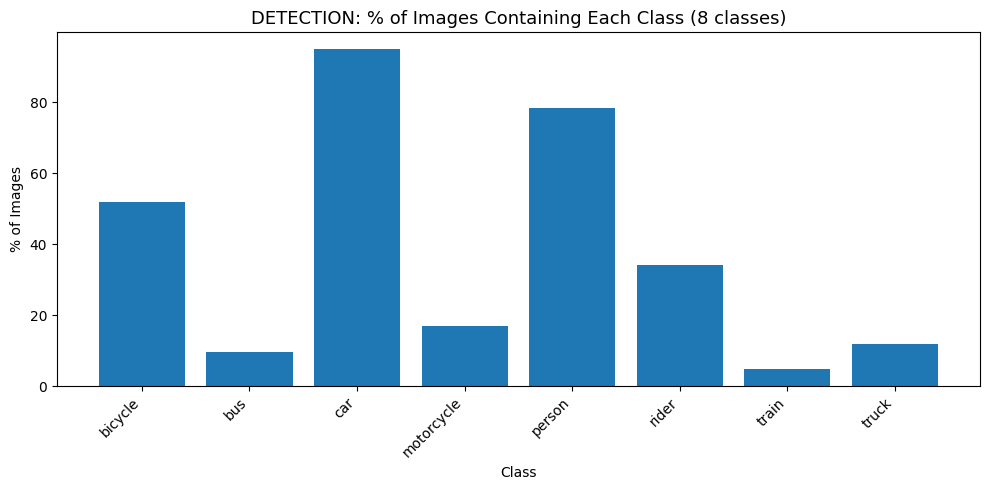

In [23]:
classes = sorted(DETECTION_CLASSES)  # Use DETECTION_CLASSES
percentages = [(class_image_count[c] / num_images) * 100 for c in classes]

plt.figure(figsize=(10, 5))
plt.bar(classes, percentages)
plt.xticks(rotation=45, ha='right')
plt.title("DETECTION: % of Images Containing Each Class (8 classes)", fontsize=13)
plt.xlabel("Class")
plt.ylabel("% of Images")
plt.tight_layout()
plt.show()

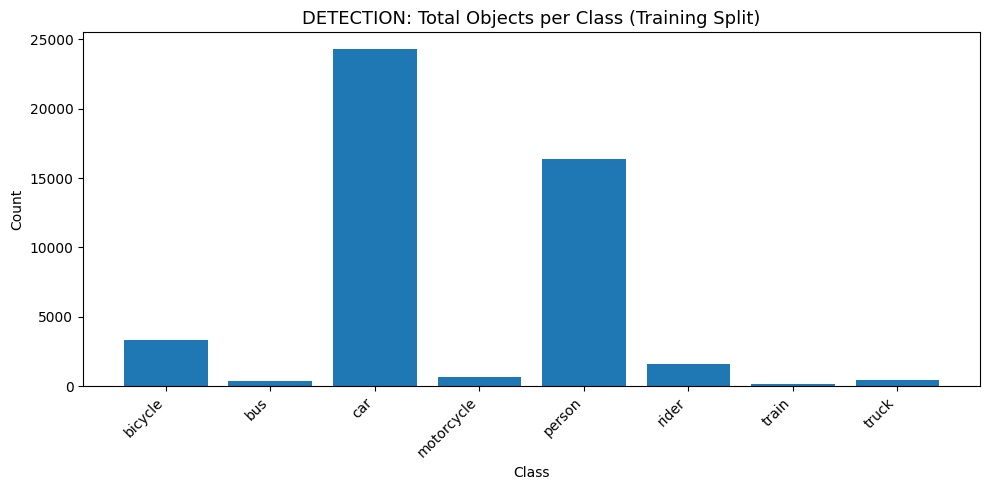

In [24]:
totals = [class_total_objects[c] for c in classes]

plt.figure(figsize=(10, 5))
plt.bar(classes, totals)
plt.xticks(rotation=45, ha='right')
plt.title("DETECTION: Total Objects per Class (Training Split)", fontsize=13)
plt.xlabel("Class")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

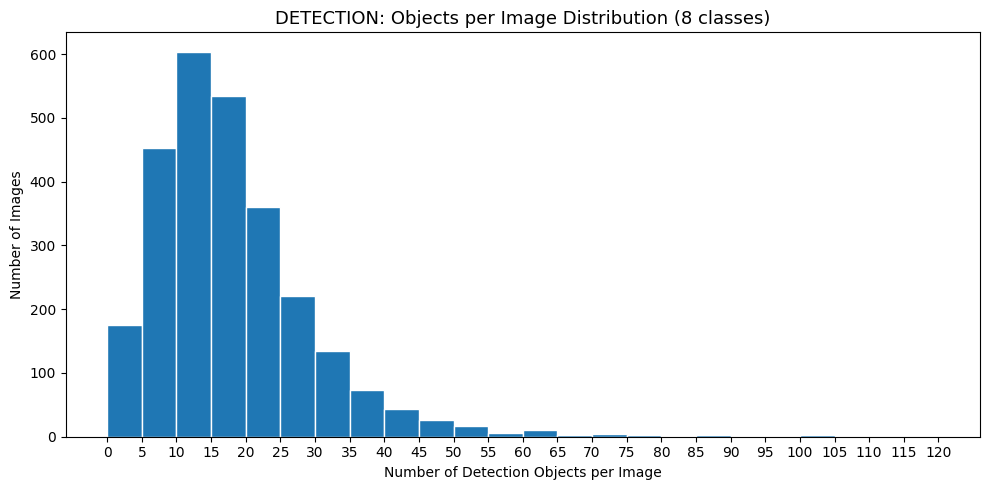

In [25]:
# Histogram with corrected bins
bins = np.arange(0, max(detection_objs_per_img) + 5, 5)  # Dynamic bins

plt.figure(figsize=(10, 5))
plt.hist(detection_objs_per_img, bins=bins, edgecolor='white')
plt.title("DETECTION: Objects per Image Distribution (8 classes)", fontsize=13)
plt.xlabel("Number of Detection Objects per Image")
plt.ylabel("Number of Images")
plt.xticks(bins)
plt.tight_layout()
plt.show()

## Derive Bounding Boxes from Polygons
We care about 10 detection classes (objects that move or matter for safety):
person, rider, car, truck, bus, train, motorcycle, bicycle, traffic sign, traffic light

For each of these objects in the polygon JSON, we convert the polygon to a bounding box
by taking the min/max of all the polygon x and y coordinates.


In [27]:


# Colours for drawing boxes — one colour per class
BOX_COLORS = {
    'person': 'red',
    'rider': 'orange',
    'car': 'dodgerblue',
    'truck': 'navy',
    'bus': 'purple',
    'train': 'brown',
    'motorcycle': 'lime',
    'bicycle': 'cyan',
    #'traffic light': 'yellow',
    #'traffic sign': 'gold'
}


def polygon_to_bbox(polygon):
    """
    Converts a list of [x, y] polygon points to a bounding box.

    Input:  list of [x, y] coordinate pairs e.g. [[10, 20], [15, 25], [12, 30]]
    Output: (x_min, y_min, x_max, y_max) integers
    """
    pts = np.array(polygon)  # shape (N, 2) where N is number of points 
    x_min = int(pts[:, 0].min())
    y_min = int(pts[:, 1].min())
    x_max = int(pts[:, 0].max())
    y_max = int(pts[:, 1].max())
    return x_min, y_min, x_max, y_max


## Bounding Box EDA - Training Split

In [ ]:
bbox_train_detection = [] 

for jf in json_files_train:   
    with open(jf) as f:
        data = json.load(f)

    for obj in data.get('objects', []):
        label = obj.get('label')

        if label in DETECTION_CLASSES:  # Only detection classes
            polygon = obj.get('polygon')

            if polygon is None or len(polygon) == 0:
                continue

            x1, y1, x2, y2 = polygon_to_bbox(polygon)

            bbox_train_detection.append({
                'label': label,
                'x1': x1, 'y1': y1,
                'x2': x2, 'y2': y2,
                'width': x2 - x1,
                'height': y2 - y1
            })

print(f'Total DETECTION bounding boxes extracted (training split): {len(bbox_train_detection)}')
print(f'Should match total detection objects: {sum(detection_obj_counter_train.values())}')

In [32]:

# Extract bounding boxes
bbox_train = []

for jf in json_files_train:   
    with open(jf) as f:
        data = json.load(f)

    for obj in data.get('objects', []):
        label = obj.get('label')

        if label in DETECTION_CLASSES:  
            polygon = obj.get('polygon')

            # Safety check
            if polygon is None or len(polygon) == 0:
                continue

            x1, y1, x2, y2 = polygon_to_bbox(polygon)

            bbox_train.append({
                'label': label,
                'x1': x1, 'y1': y1,
                'x2': x2, 'y2': y2,
                'width': x2 - x1,
                'height': y2 - y1
            })


# Summary
print(f'Total bounding boxes extracted from JSON files in train split: {len(bbox_train)}\n')
print(f'Should be equal to total no of objects of interest in train split: {sum(class_total_objects.values())} ')

print('Per-class count:')
class_counts = Counter(r['label'] for r in bbox_train)

for cls, count in class_counts.most_common():
    print(f'{cls:15s}: {count}')

Total bounding boxes extracted from JSON files in train split: 47248

Should be equal to total no of objects of interest in train split: 153189 
Per-class count:
car            : 24292
person         : 16392
bicycle        : 3347
rider          : 1626
motorcycle     : 652
truck          : 429
bus            : 360
train          : 150


### BBOX Basic Summary Stats

In [33]:

widths = np.array([b['width'] for b in bbox_train])
heights = np.array([b['height'] for b in bbox_train])
areas = widths * heights
aspect_ratios = widths / (heights + 1e-6)

print("=== Bounding Box Stats ===")
print(f"Total boxes: {len(bbox_train)}")

print("\n--- Width ---")
print(f"Mean: {widths.mean():.2f}, Min: {widths.min()}, Max: {widths.max()}")

print("\n--- Height ---")
print(f"Mean: {heights.mean():.2f}, Min: {heights.min()}, Max: {heights.max()}")

print("\n--- Area ---")
print(f"Mean: {areas.mean():.2f}, Min: {areas.min()}, Max: {areas.max()}")

print("\n--- Aspect Ratio (w/h) ---")
print(f"Mean: {aspect_ratios.mean():.2f}")

=== Bounding Box Stats ===
Total boxes: 47248

--- Width ---
Mean: 89.80, Min: 1, Max: 2047

--- Height ---
Mean: 101.31, Min: 3, Max: 1023

--- Area ---
Mean: 16720.92, Min: 15, Max: 1132930

--- Aspect Ratio (w/h) ---
Mean: 0.98


#### Extended Statistical Summary - Std Dev, Skewness, Outliers

In [34]:
# === Extended Statistical Summary ===
# Std Dev tells spread, Skewness tells shape, CV tells relative spread, IQR rule catches outliers

from scipy.stats import skew

print("=== Extended Statistical Summary ===")
for name, arr in [("Width", widths), ("Height", heights), ("Area", areas), ("Aspect Ratio", aspect_ratios)]:
    p25, p50, p75, p90, p99 = np.percentile(arr, [25, 50, 75, 90, 99])
    iqr      = p75 - p25
    cv       = arr.std() / arr.mean()
    outliers = np.sum((arr < p25 - 1.5 * iqr) | (arr > p75 + 1.5 * iqr))

    print(f"\n{name}:")
    print(f"  Mean     : {arr.mean():.2f}")
    print(f"  Std Dev  : {arr.std():.2f}")
    print(f"  Skewness : {skew(arr):.2f}  {'← right-skewed (long tail of large boxes)' if skew(arr) > 1 else '← fairly symmetric' if abs(skew(arr)) < 0.5 else ''}")
    print(f"  CV       : {cv:.2f}          {'← high variance relative to mean' if cv > 0.5 else '← low variance'}")
    print(f"  p25={p25:.1f}  p50={p50:.1f}  p75={p75:.1f}  p90={p90:.1f}  p99={p99:.1f}")
    print(f"  Outliers (IQR rule): {outliers} ({100 * outliers / len(arr):.1f}% of boxes)")

=== Extended Statistical Summary ===

Width:
  Mean     : 89.80
  Std Dev  : 105.91
  Skewness : 3.29  ← right-skewed (long tail of large boxes)
  CV       : 1.18          ← high variance relative to mean
  p25=29.0  p50=52.0  p75=105.0  p90=210.0  p99=523.0
  Outliers (IQR rule): 4423 (9.4% of boxes)

Height:
  Mean     : 101.31
  Std Dev  : 102.23
  Skewness : 2.70  ← right-skewed (long tail of large boxes)
  CV       : 1.01          ← high variance relative to mean
  p25=39.0  p50=67.0  p75=123.0  p90=218.0  p99=528.0
  Outliers (IQR rule): 3695 (7.8% of boxes)

Area:
  Mean     : 16720.92
  Std Dev  : 42701.34
  Skewness : 6.40  ← right-skewed (long tail of large boxes)
  CV       : 2.55          ← high variance relative to mean
  p25=1188.0  p50=3472.0  p75=11830.0  p90=39521.2  p99=219387.6
  Outliers (IQR rule): 6371 (13.5% of boxes)

Aspect Ratio:
  Mean     : 0.98
  Std Dev  : 0.66
  Skewness : 2.45  ← right-skewed (long tail of large boxes)
  CV       : 0.68          ← high v

### Width / Height Distribution

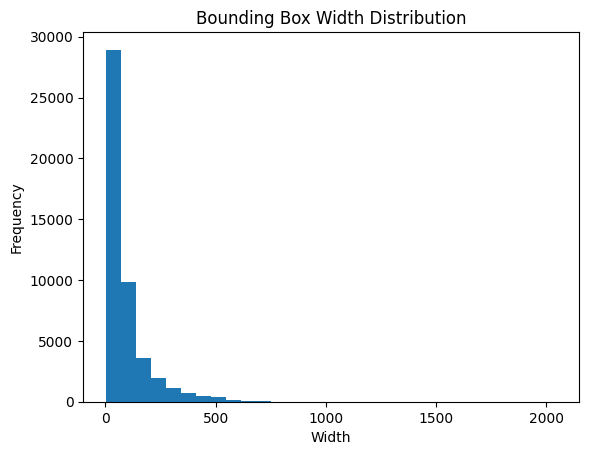

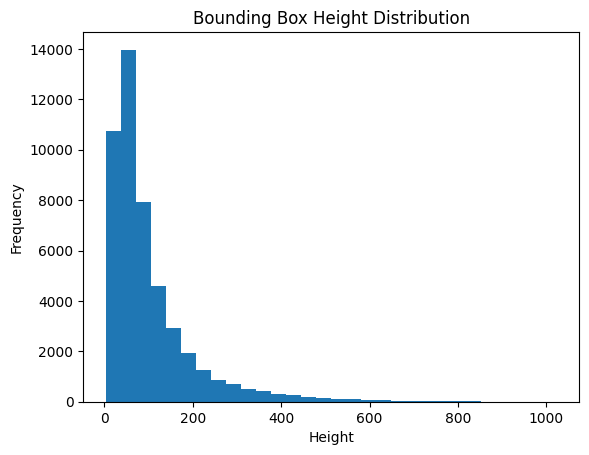

In [35]:

plt.figure()
plt.hist(widths, bins=30)
plt.title("Bounding Box Width Distribution")
plt.xlabel("Width")
plt.ylabel("Frequency")
plt.show()

plt.figure()
plt.hist(heights, bins=30)
plt.title("Bounding Box Height Distribution")
plt.xlabel("Height")
plt.ylabel("Frequency")
plt.show()

### Area Distribution

#### small vs large object imbalance

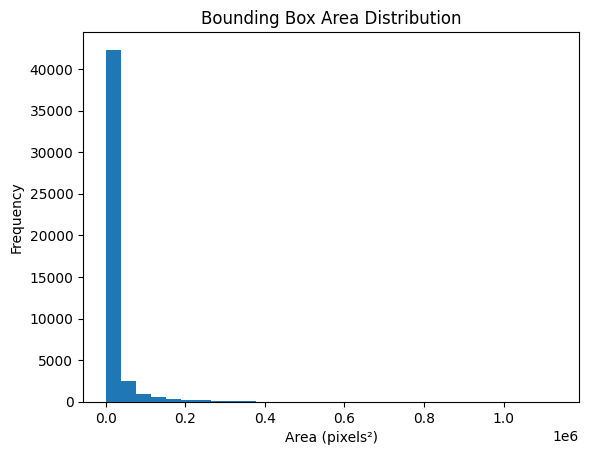

In [36]:
plt.figure()
plt.hist(areas, bins=30)
plt.title("Bounding Box Area Distribution")
plt.xlabel("Area (pixels²)")
plt.ylabel("Frequency")
plt.show()

### === Log-scale Area Distribution ===

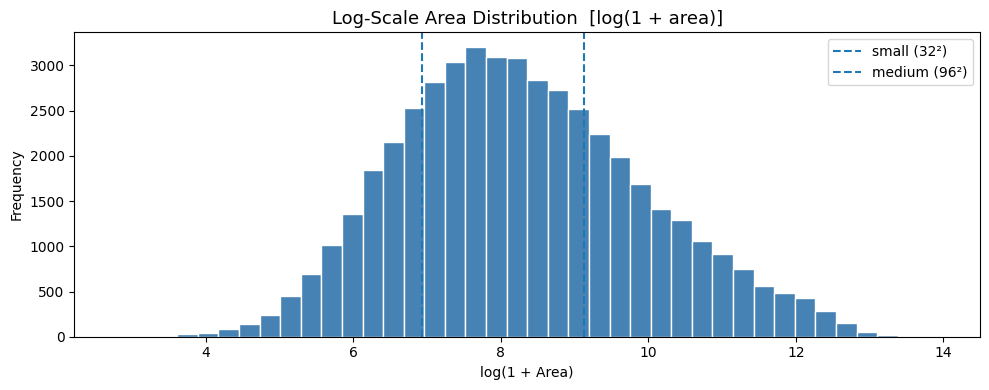

Why log scale?
  Raw area: a few buses/trucks have area 100k+ pixels
  They compress all small objects to the left edge
  Log scale reveals the full distribution shape


In [37]:

# Raw area is right-skewed — a few very large boxes dominate the x-axis.
# log1p(area) compresses the scale so small objects become visible.
# log1p = log(1 + x) — safe even if area = 0

plt.figure(figsize=(10, 4))
plt.hist(np.log1p(areas), bins=40, color='steelblue', edgecolor='white')
plt.title("Log-Scale Area Distribution  [log(1 + area)]", fontsize=13)
plt.xlabel("log(1 + Area)")
plt.ylabel("Frequency")

# Mark small / medium / large thresholds in log space
for label, val in [("small (32²)", np.log1p(32**2)),
                   ("medium (96²)", np.log1p(96**2))]:
    plt.axvline(val, linestyle='--', label=label)

plt.legend()
plt.tight_layout()
plt.show()

print("Why log scale?")
print("  Raw area: a few buses/trucks have area 100k+ pixels")
print("  They compress all small objects to the left edge")
print("  Log scale reveals the full distribution shape")


### Aspect Ratio Distribution

#### Helps with anchor box design (YOLO etc.)

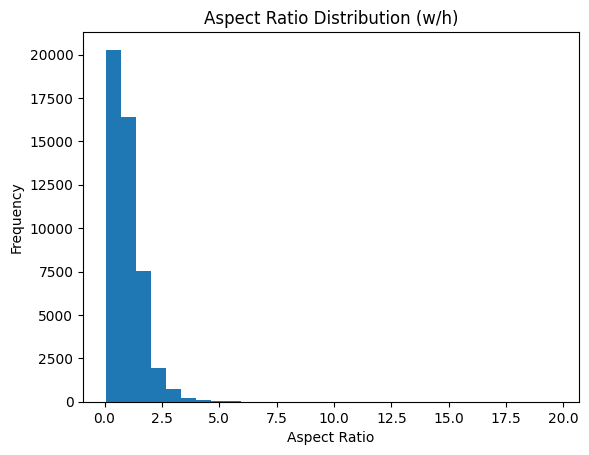

In [38]:
plt.figure()
plt.hist(aspect_ratios, bins=30)
plt.title("Aspect Ratio Distribution (w/h)")
plt.xlabel("Aspect Ratio")
plt.ylabel("Frequency")
plt.show()

### === Anchor Ratio Clustering ===

In [39]:

# KMeans on (w, h) tells us what aspect ratios actually exist in the data.
# Compare result with config anchor_ratios: [0.5, 1.0, 2.0]
# If data clusters differ significantly → update your config.yaml

from sklearn.cluster import KMeans

wh = np.stack([widths, heights], axis=1).astype(np.float32)

# Normalize to unit area so clustering is based on shape, not size
wh_norm = wh / np.sqrt((wh[:, 0] * wh[:, 1]).reshape(-1, 1) + 1e-6)

kmeans = KMeans(n_clusters=9, random_state=42, n_init=10)
kmeans.fit(wh_norm)
centers = kmeans.cluster_centers_

data_ratios  = sorted(centers[:, 0] / centers[:, 1])
config_ratios = [0.5, 1.0, 2.0]

print("=== Anchor Aspect Ratio Analysis ===")
print(f"\nData-driven ratios (KMeans k=9):")
for r in data_ratios:
    print(f"  {r:.2f}")

print(f"\nConfig anchor_ratios: {config_ratios}")

# Check coverage — for each data ratio, find nearest config ratio
print("\nCoverage check (nearest config ratio per cluster):")
for r in data_ratios:
    nearest = min(config_ratios, key=lambda x: abs(x - r))
    gap = abs(r - nearest)
    flag = "  ← gap > 0.3, consider adding" if gap > 0.3 else ""
    print(f"  data={r:.2f}  nearest_config={nearest:.2f}  gap={gap:.2f}{flag}")

=== Anchor Aspect Ratio Analysis ===

Data-driven ratios (KMeans k=9):
  0.18
  0.30
  0.40
  0.54
  0.76
  1.08
  1.44
  2.10
  3.30

Config anchor_ratios: [0.5, 1.0, 2.0]

Coverage check (nearest config ratio per cluster):
  data=0.18  nearest_config=0.50  gap=0.32  ← gap > 0.3, consider adding
  data=0.30  nearest_config=0.50  gap=0.20
  data=0.40  nearest_config=0.50  gap=0.10
  data=0.54  nearest_config=0.50  gap=0.04
  data=0.76  nearest_config=1.00  gap=0.24
  data=1.08  nearest_config=1.00  gap=0.08
  data=1.44  nearest_config=1.00  gap=0.44  ← gap > 0.3, consider adding
  data=2.10  nearest_config=2.00  gap=0.10
  data=3.30  nearest_config=2.00  gap=1.30  ← gap > 0.3, consider adding


### Per-Class Box Size Stats

In [40]:

class_stats = defaultdict(list)

for b in bbox_train:
    class_stats[b['label']].append((b['width'], b['height']))

print(f"{'Class':15s} {'Count':>6} {'Avg Area':>12}")

for cls, vals in class_stats.items():
    vals = np.array(vals)
    areas_cls = vals[:, 0] * vals[:, 1]
    
    print(f"{cls:15s} {len(vals):6d} {areas_cls.mean():12.2f}")

Class            Count     Avg Area
car              24292     22091.68
bicycle           3347     10171.84
person           16392      8309.91
motorcycle         652     15999.50
rider             1626     10721.46
bus                360     47912.20
truck              429     47512.10
train              150    117479.83


#### Per-Class Width / Height Boxplots 

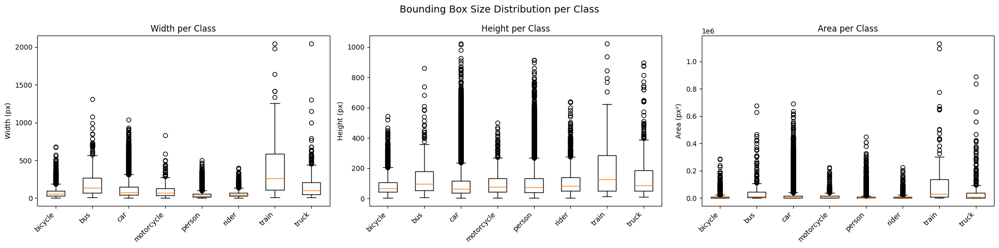


Class              Median W     Std W    Median H     Std H   Median Area
----------------------------------------------------------------------
bicycle                53.0      71.8        66.0      66.7        3416.0
bus                   132.5     202.4        95.0     126.0       12533.0
car                    76.0     118.5        62.0     105.7        4631.5
motorcycle             70.0      88.4        77.0      83.9        5173.0
person                 31.0      41.0        72.0      99.4        2175.0
rider                  41.0      49.6        83.0      94.3        3328.5
train                 264.5     390.1       126.0     190.3       32092.0
truck                 103.0     193.7        88.0     159.7        8787.0


In [41]:

# Shows spread and outliers per class in one figure
# More informative than just avg area

cls_list    = sorted(class_stats.keys())
cls_widths  = [np.array(class_stats[c])[:, 0] for c in cls_list]
cls_heights = [np.array(class_stats[c])[:, 1] for c in cls_list]
cls_areas   = [np.array(class_stats[c])[:, 0] * np.array(class_stats[c])[:, 1] for c in cls_list]

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].boxplot(cls_widths, labels=cls_list, vert=True)
axes[0].set_title("Width per Class", fontsize=12)
axes[0].set_xticklabels(cls_list, rotation=45, ha='right')
axes[0].set_ylabel("Width (px)")

axes[1].boxplot(cls_heights, labels=cls_list, vert=True)
axes[1].set_title("Height per Class", fontsize=12)
axes[1].set_xticklabels(cls_list, rotation=45, ha='right')
axes[1].set_ylabel("Height (px)")

axes[2].boxplot(cls_areas, labels=cls_list, vert=True)
axes[2].set_title("Area per Class", fontsize=12)
axes[2].set_xticklabels(cls_list, rotation=45, ha='right')
axes[2].set_ylabel("Area (px²)")

plt.suptitle("Bounding Box Size Distribution per Class", fontsize=14)
plt.tight_layout()
plt.show()

# Print median + std per class
print(f"\n{'Class':15s}  {'Median W':>10}  {'Std W':>8}  {'Median H':>10}  {'Std H':>8}  {'Median Area':>12}")
print("-" * 70)
for cls, w_arr, h_arr, a_arr in zip(cls_list, cls_widths, cls_heights, cls_areas):
    print(f"{cls:15s}  {np.median(w_arr):10.1f}  {w_arr.std():8.1f}  "
          f"{np.median(h_arr):10.1f}  {h_arr.std():8.1f}  {np.median(a_arr):12.1f}")

### === Correlation Matrix ===

=== Correlation Matrix ===
              width  height   area  aspect_ratio
width         1.000   0.704  0.863         0.389
height        0.704   1.000  0.813        -0.139
area          0.863   0.813  1.000         0.103
aspect_ratio  0.389  -0.139  0.103         1.000


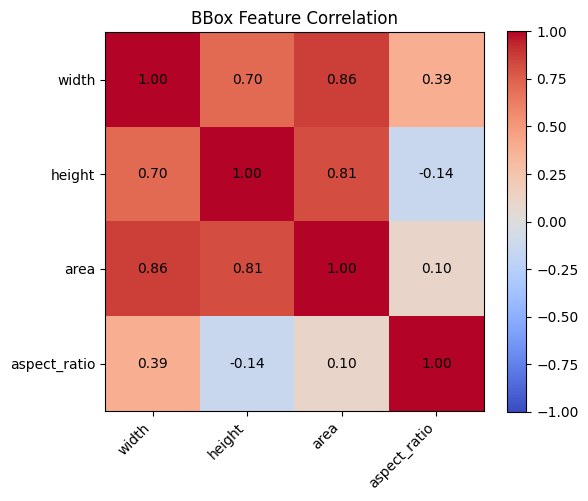


What to look for:
  width-height  > 0.7 → objects scale proportionally
  area-aspect   high  → large objects have strong shape bias
  aspect-height high  → tall objects dominate aspect ratio


In [42]:

# width/height should correlate strongly (tall objects tend to be wide too)
# area vs aspect_ratio correlation tells us if large objects have a preferred shape

import pandas as pd

df_bbox = pd.DataFrame({
    'width':        widths,
    'height':       heights,
    'area':         areas,
    'aspect_ratio': aspect_ratios,
})

corr = df_bbox.corr()

print("=== Correlation Matrix ===")
print(corr.round(3))

fig, ax = plt.subplots(figsize=(6, 5))
im = ax.imshow(corr.values, cmap='coolwarm', vmin=-1, vmax=1)
plt.colorbar(im)
ax.set_xticks(range(4)); ax.set_yticks(range(4))
ax.set_xticklabels(corr.columns, rotation=45, ha='right')
ax.set_yticklabels(corr.columns)
for i in range(4):
    for j in range(4):
        ax.text(j, i, f"{corr.values[i, j]:.2f}", ha='center', va='center', fontsize=10)
ax.set_title("BBox Feature Correlation", fontsize=12)
plt.tight_layout()
plt.show()

print("\nWhat to look for:")
print("  width-height  > 0.7 → objects scale proportionally")
print("  area-aspect   high  → large objects have strong shape bias")
print("  aspect-height high  → tall objects dominate aspect ratio")

### Object Position Distribution

#### Shows center bias (very common in datasets)

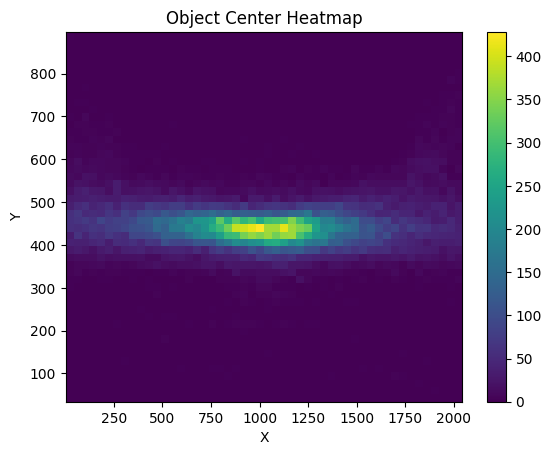

In [43]:

centers_x = [(b['x1'] + b['x2']) / 2 for b in bbox_train]
centers_y = [(b['y1'] + b['y2']) / 2 for b in bbox_train]

plt.figure()
plt.hist2d(centers_x, centers_y, bins=50)
plt.title("Object Center Heatmap")
plt.xlabel("X")
plt.ylabel("Y")
plt.colorbar()
plt.show()

### === Class Co-occurrence Matrix ===

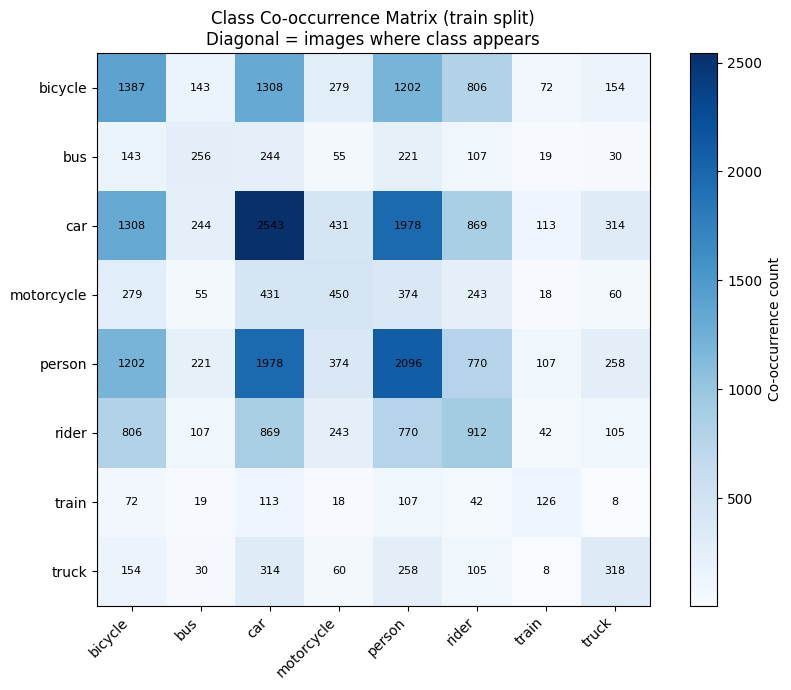


Top 5 most common class pairs:
  car          + person       : 1978 images
  bicycle      + car          : 1308 images
  bicycle      + person       : 1202 images
  car          + rider        : 869 images
  bicycle      + rider        : 806 images


In [44]:

# Which classes appear together in the same image?
# High co-occurrence → model must distinguish similar-looking objects simultaneously
# e.g. person+bicycle, person+motorcycle are common pairs in traffic scenes

import itertools

cls_list_det = sorted(DETECTION_CLASSES)
cls_idx      = {c: i for i, c in enumerate(cls_list_det)}
n            = len(cls_list_det)
cooccur      = np.zeros((n, n), dtype=int)

for jf in json_files_train:
    with open(jf) as f:
        data = json.load(f)
    present = set(o['label'] for o in data['objects'] if o['label'] in DETECTION_CLASSES)
    for a, b in itertools.combinations(present, 2):
        cooccur[cls_idx[a], cls_idx[b]] += 1
        cooccur[cls_idx[b], cls_idx[a]] += 1
    # diagonal = images where this class appears at all
    for c in present:
        cooccur[cls_idx[c], cls_idx[c]] += 1

fig, ax = plt.subplots(figsize=(9, 7))
im = ax.imshow(cooccur, cmap='Blues')
plt.colorbar(im, label='Co-occurrence count')
ax.set_xticks(range(n)); ax.set_yticks(range(n))
ax.set_xticklabels(cls_list_det, rotation=45, ha='right')
ax.set_yticklabels(cls_list_det)
for i in range(n):
    for j in range(n):
        ax.text(j, i, str(cooccur[i, j]), ha='center', va='center', fontsize=8)
ax.set_title("Class Co-occurrence Matrix (train split)\nDiagonal = images where class appears", fontsize=12)
plt.tight_layout()
plt.show()

# Top 5 most common pairs
pairs = []
for i, a in enumerate(cls_list_det):
    for j, b in enumerate(cls_list_det):
        if j > i:
            pairs.append((a, b, cooccur[i, j]))
pairs.sort(key=lambda x: -x[2])
print("\nTop 5 most common class pairs:")
for a, b, count in pairs[:5]:
    print(f"  {a:12s} + {b:12s} : {count} images")

## Small vs Medium vs Large Objects

In [45]:
small = np.sum(areas < 32**2)
medium = np.sum((areas >= 32**2) & (areas < 96**2))
large = np.sum(areas >= 96**2)

print("\n--- Object Size Categories ---")
print(f"Small: {small}")
print(f"Medium: {medium}")
print(f"Large: {large}")


--- Object Size Categories ---
Small: 10353
Medium: 23001
Large: 13894


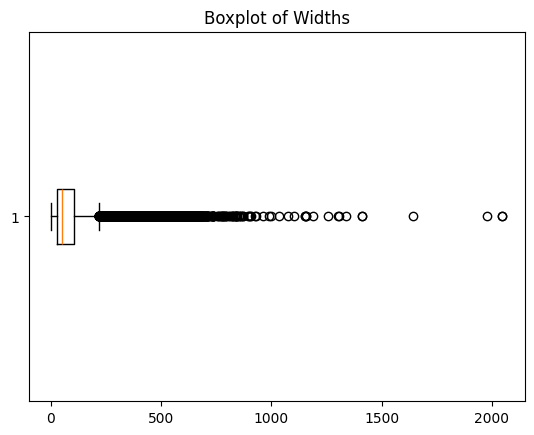

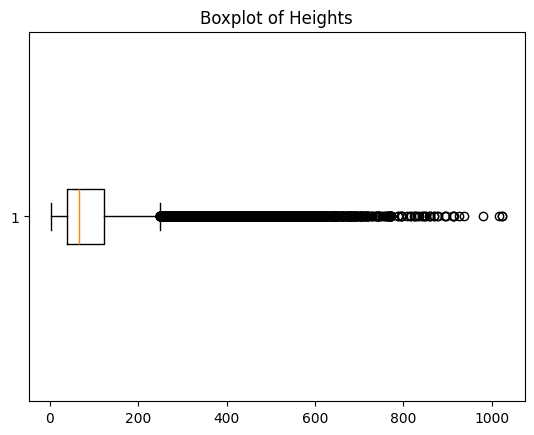

In [46]:
plt.figure()
plt.boxplot(widths, vert=False)
plt.title("Boxplot of Widths")
plt.show()

plt.figure()
plt.boxplot(heights, vert=False)
plt.title("Boxplot of Heights")
plt.show()

In [47]:
def find_json_for_image(image_path):
    """
    Given an image path, returns the corresponding polygon JSON path.
    Same logic as find_label_mask but looks for _gtFine_polygons.json instead.
    """
    base  = image_path.stem.replace('_leftImg8bit', '')
    split = image_path.parent.parent.name
    city  = image_path.parent.name
    json_path = MASKS_DIR / split / city / f'{base}_gtFine_polygons.json'
    return json_path if json_path.exists() else None

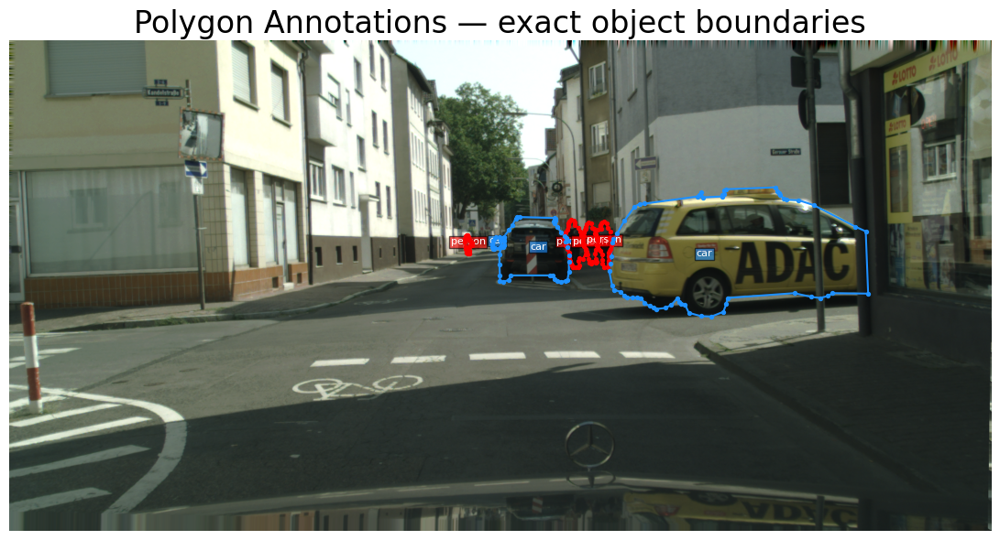

In [48]:
chosen_image = None
chosen_objs = None

for img_path in image_files:
    json_path = find_json_for_image(img_path)
    if json_path is None:
        continue

    with open(json_path) as f:
        data = json.load(f)

    det_objs = [o for o in data.get('objects', []) if o.get('label') in DETECTION_CLASSES]

    if len(det_objs) >= 3:
        chosen_image = img_path
        chosen_objs  = det_objs
        break

# ---- Visualization ----
if chosen_image is not None:

    img = np.array(Image.open(chosen_image).convert('RGB'))

    fig, ax = plt.subplots(figsize=(14, 6))
    ax.imshow(img)

    for obj in chosen_objs:
        polygon = obj.get('polygon')

        if polygon is None or len(polygon) == 0:
            continue

        pts = np.array(polygon)
        color = BOX_COLORS.get(obj['label'], 'yellow')

        # Close polygon
        closed = np.vstack([pts, pts[0]])

        # Draw edges
        ax.plot(closed[:, 0], closed[:, 1], color=color, linewidth=1.5)

        # Draw points
        ax.scatter(pts[:, 0], pts[:, 1], color=color, s=8, zorder=5)

        # Label at center
        cx, cy = pts.mean(axis=0)
        ax.text(cx, cy, obj['label'],
                color='white',
                fontsize=8,
                ha='center',
                bbox=dict(facecolor=color, alpha=0.6, pad=1))

    ax.set_title('Polygon Annotations — exact object boundaries', fontsize=24)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

else:
    print("No image found with >= 3 detection objects.")

## Visualise Bounding Boxes on Image
matplotlib.patches.Rectangle draws a box on top of an image.
Parameters: (x_start, y_start), width, height, linewidth, edgecolor, facecolor='none'
Setting facecolor='none' means only the border is drawn, not a filled box.

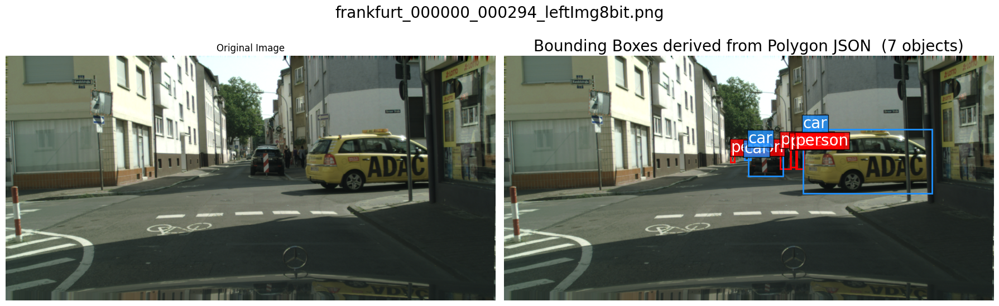

In [49]:



# Find an image that has at least 3 detection objects
chosen_image = None
chosen_objs  = []

for img_path in image_files:
    json_path = find_json_for_image(img_path)
    if json_path is None:
        continue
    with open(json_path) as f:
        data = json.load(f)
    det_objs = [o for o in data['objects'] if o['label'] in DETECTION_CLASSES]
    if len(det_objs) >= 3:
        chosen_image = img_path
        chosen_objs  = det_objs
        break

if chosen_image:
    img = np.array(Image.open(chosen_image).convert('RGB'))

    fig, axes = plt.subplots(1, 2, figsize=(18, 6))

    # Left: raw image
    axes[0].imshow(img)
    axes[0].set_title('Original Image', fontsize=12)
    axes[0].axis('off')

    # Right: image with bounding boxes
    axes[1].imshow(img)
    for obj in chosen_objs:
        x1, y1, x2, y2 = polygon_to_bbox(obj['polygon'])
        color = BOX_COLORS.get(obj['label'], 'black')
        rect  = patches.Rectangle(
            (x1, y1),           # top-left corner
            x2 - x1,            # width
            y2 - y1,            # height
            linewidth=2,
            edgecolor=color,
            facecolor='none'    # transparent fill
        )
        axes[1].add_patch(rect)
        # Label text above the box
        axes[1].text(
            x1, max(y1 - 4, 0),
            obj['label'],
            color='white', fontsize=20,
            bbox=dict(facecolor=color, alpha=0.8, pad=1)
        )
    axes[1].set_title(f'Bounding Boxes derived from Polygon JSON  ({len(chosen_objs)} objects)', fontsize=20)
    axes[1].axis('off')

    plt.suptitle(chosen_image.name, fontsize=20)
    plt.tight_layout()
    plt.show()
else:
    print('Could not find an image with 3+ detection objects. Check paths.')

## Full View: Image + Segmentation Mask + Bounding Boxes Together
This is the final check — showing everything at once.
Left: original image
Middle: coloured segmentation mask
Right: overlay with bounding boxes drawn on top

If this looks correct, your data pipeline is ready for the Dataset class.

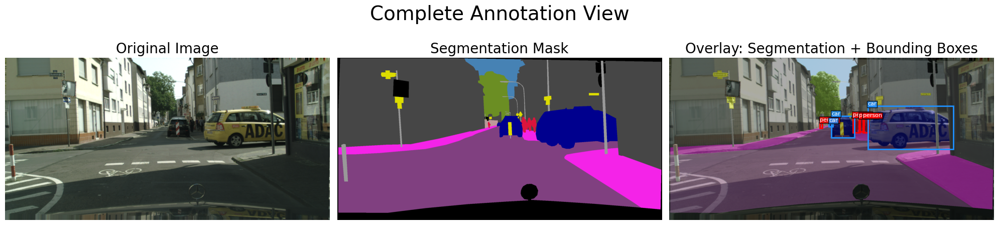

In [50]:
if chosen_image:
    mask_path,_ = find_label_mask(chosen_image)

    if mask_path:
        img      = np.array(Image.open(chosen_image).convert('RGB'))
        mask     = np.array(Image.open(mask_path))
        mask_col = label_to_color(mask)
        overlay  = (0.55 * img + 0.45 * mask_col.astype(np.float32)).astype(np.uint8)

        fig, axes = plt.subplots(1, 3, figsize=(20, 5))

        axes[0].imshow(img)
        axes[0].set_title('Original Image', fontsize=20)
        axes[0].axis('off')

        axes[1].imshow(mask_col)
        axes[1].set_title('Segmentation Mask', fontsize=20)
        axes[1].axis('off')

        axes[2].imshow(overlay)
        for obj in chosen_objs:
            x1, y1, x2, y2 = polygon_to_bbox(obj['polygon'])
            color = BOX_COLORS.get(obj['label'], 'yellow')
            rect  = patches.Rectangle(
                (x1, y1), x2-x1, y2-y1,
                linewidth=2, edgecolor=color, facecolor='none'
            )
            axes[2].add_patch(rect)
            axes[2].text(
                x1, max(y1-4, 0), obj['label'],
                color='white', fontsize=8,
                bbox=dict(facecolor=color, alpha=0.8, pad=1)
            )
        axes[2].set_title('Overlay: Segmentation + Bounding Boxes', fontsize=20)
        axes[2].axis('off')

        plt.suptitle('Complete Annotation View', fontsize=28)
        plt.tight_layout()
        plt.show()
    else:
        print('Label mask not found for this image.')

Objects per image — min: 4, max: 66, mean: 19.0


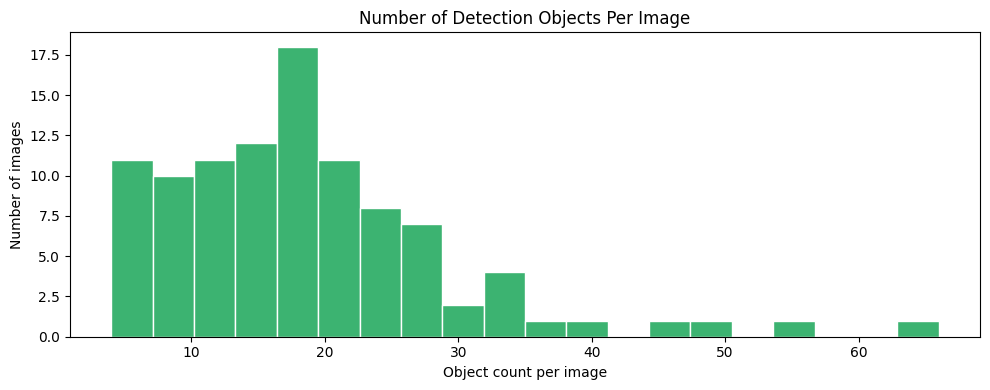

In [51]:
if json_files:
    objects_per_image = []
    for jf in json_files[:100]:
        with open(jf) as f:
            data = json.load(f)
        det_count = sum(1 for o in data['objects'] if o['label'] in DETECTION_CLASSES)
        objects_per_image.append(det_count)

    print(f'Objects per image — min: {min(objects_per_image)}, '
          f'max: {max(objects_per_image)}, '
          f'mean: {np.mean(objects_per_image):.1f}')

    fig, ax = plt.subplots(figsize=(10, 4))
    ax.hist(objects_per_image, bins=20, color='mediumseagreen', edgecolor='white')
    ax.set_title('Number of Detection Objects Per Image', fontsize=12)
    ax.set_xlabel('Object count per image')
    ax.set_ylabel('Number of images')
    plt.tight_layout()
    plt.show()

## EDA Summary


In [56]:
print('=' * 65)
print('EDA SUMMARY — Cityscapes')
print('=' * 65)

# ── Dataset Overview ─────────────────────────────────────────────
print('\n[ DATASET OVERVIEW ]')
print(f'  Total images          : {len(image_files)}')
print(f'  Splits                : {dict(split_counter)}')
print(f'  Cities (train)        : {len(city_counter_train)}')
print(f'  Cities (val)          : {len(city_counter_val)}')
print(f'  Image resolution      : {min(widths)}x{min(heights)} to {max(widths)}x{max(heights)} px (all identical in Cityscapes)')
print(f'  Annotation per image  : 5 PNGs + 1 JSON')
print(f'  Total mask files      : {len(all_mask_files)}')
print(f'  Total polygon JSONs   : {len(json_files)}')

# ── Segmentation ─────────────────────────────────────────────────
print('\n[ SEGMENTATION ]')
print(f'  Mask file used        : _gtFine_labelTrainIds.png')
print(f'  Pixel values          : 0-18 (train IDs) + 255 (ignore)')
print(f'  Sampled masks         : 100')
if pixel_counts:
    dominant = max(pixel_counts, key=pixel_counts.get)
    rarest   = min(pixel_counts, key=pixel_counts.get)
    print(f'  Most dominant class   : {CLASS_NAMES[dominant]}  ({100*pixel_counts[dominant]/total_pixels:.1f}% of pixels)')
    print(f'  Rarest class          : {CLASS_NAMES[rarest]}  ({100*pixel_counts[rarest]/total_pixels:.2f}% of pixels)')
    print(f'  Top 3 dominant        :', end=' ')
    top3 = sorted(pixel_counts, key=pixel_counts.get, reverse=True)[:3]
    print(', '.join(f'{CLASS_NAMES[t]} ({100*pixel_counts[t]/total_pixels:.1f}%)' for t in top3))
    print(f'  Bottom 3 rarest       :', end=' ')
    bot3 = sorted(pixel_counts, key=pixel_counts.get)[:3]
    print(', '.join(f'{CLASS_NAMES[t]} ({100*pixel_counts[t]/total_pixels:.2f}%)' for t in bot3))

# ── Detection ────────────────────────────────────────────────────
print('\n[ DETECTION ]')
print(f'  Boxes derived from    : _gtFine_polygons.json (polygon → bbox)')
print(f'  Detection classes     : {len(DETECTION_CLASSES)} ({", ".join(sorted(DETECTION_CLASSES))})')
print(f'  Total boxes (train)   : {len(bbox_train)}')
print(f'  Objects per image     : mean={np.mean(obj_per_img_interest):.1f}  '
      f'min={np.min(obj_per_img_interest)}  max={np.max(obj_per_img_interest)}')

print(f'\n  Per-class box count:')
for cls, count in sorted(class_counts.items(), key=lambda x: -x[1]):
    pct = 100 * count / len(bbox_train)
    bar = '█' * int(pct / 2)
    print(f'    {cls:15s}: {count:6d}  ({pct:5.1f}%)  {bar}')

# ── BBox Statistics ───────────────────────────────────────────────
print('\n[ BOUNDING BOX STATISTICS ]')
print(f'  Width   — mean={widths.mean():.1f}  std={widths.std():.1f}  '
      f'min={widths.min()}  max={widths.max()}  skew={skew(widths):.2f}')
print(f'  Height  — mean={heights.mean():.1f}  std={heights.std():.1f}  '
      f'min={heights.min()}  max={heights.max()}  skew={skew(heights):.2f}')
print(f'  Area    — mean={areas.mean():.1f}  std={areas.std():.1f}  '
      f'min={areas.min()}  max={areas.max()}  skew={skew(areas):.2f}')
print(f'  Aspect  — mean={aspect_ratios.mean():.2f}  std={aspect_ratios.std():.2f}')

print(f'\n  Size categories:')
print(f'    Small  (area < 32²)          : {small:6d}  ({100*small/len(areas):.1f}%)')
print(f'    Medium (32² ≤ area < 96²)    : {medium:6d}  ({100*medium/len(areas):.1f}%)')
print(f'    Large  (area ≥ 96²)          : {large:6d}  ({100*large/len(areas):.1f}%)')

print(f'\n  Percentiles (area):')
for p in [25, 50, 75, 90, 99]:
    print(f'    p{p:<3}: {np.percentile(areas, p):.0f} px²')

# ── Anchor Analysis ───────────────────────────────────────────────
print('\n[ ANCHOR ANALYSIS ]')
print(f'  Config anchor_ratios  : [0.5, 1.0, 2.0]')
print(f'  Data-driven ratios    : {[round(r, 2) for r in data_ratios]}')
gaps = [round(min(abs(r - c) for c in [0.5, 1.0, 2.0]), 2) for r in data_ratios]
if max(gaps) > 0.3:
    print(f'  ⚠ Some data ratios not well covered — consider updating config.yaml')
else:
    print(f'  ✓ Config ratios cover data well')

# ── Class Co-occurrence ───────────────────────────────────────────
print('\n[ TOP CLASS CO-OCCURRENCES ]')
for a, b, count in pairs[:5]:
    print(f'  {a:12s} + {b:12s} : {count} images')

# ── Key Decisions ─────────────────────────────────────────────────
print('\n[ DECISIONS BASED ON EDA ]')
print('  1. Use _gtFine_labelTrainIds.png — already mapped to 0-18/255, no remap needed')
print('  2. Derive bboxes from polygon JSON (min/max of polygon coords)')
print('  3. Class imbalance is severe → use Dice Loss or Weighted CE')
print('  4. Small objects dominate → ensure small anchor sizes (32px) are in config')
print('  5. Monitor per-class IoU, not just mean mIoU')
print('  6. person+car and person+bicycle are most frequent co-occurring pairs')
print(f'  7. Area is right-skewed (skew={skew(areas):.1f}) → log-scale useful for debugging')

print('\n[ NEXT STEP ]')
print('  → src/ods/datasets/cityscapes_dataset.py')
print('  Build PyTorch Dataset using labelTrainIds.png + polygon JSON')
print('=' * 65)

EDA SUMMARY — Cityscapes

[ DATASET OVERVIEW ]
  Total images          : 3475
  Splits                : {'val': 500, 'train': 2678, 'test': 297}
  Cities (train)        : 18
  Cities (val)          : 3
  Image resolution      : 1x3 to 2047x1023 px (all identical in Cityscapes)
  Annotation per image  : 5 PNGs + 1 JSON
  Total mask files      : 3475
  Total polygon JSONs   : 3475

[ SEGMENTATION ]
  Mask file used        : _gtFine_labelTrainIds.png
  Pixel values          : 0-18 (train IDs) + 255 (ignore)
  Sampled masks         : 100
  Most dominant class   : road  (37.0% of pixels)
  Rarest class          : motorcycle  (0.05% of pixels)
  Top 3 dominant        : road (37.0%), building (22.3%), vegetation (16.4%)
  Bottom 3 rarest       : motorcycle (0.05%), train (0.12%), rider (0.14%)

[ DETECTION ]
  Boxes derived from    : _gtFine_polygons.json (polygon → bbox)
  Detection classes     : 8 (bicycle, bus, car, motorcycle, person, rider, train, truck)
  Total boxes (train)   : 47248
 